# Sounds
a demo of sound synthesis, done the most painful way possible

## Import dependencies

In [1]:
using Plots

## Constants we will use later

In [2]:
params = Dict()
params["sampling frequency"] = 41000

kick = Dict()
kick["base frequency"] = 35
kick["note length"] = 0.65
kick["attack"] = 0.025
kick["decay"] = 0.3
kick["sustain"] = 0.5
kick["release"] = 0.5

0.5

## Just a sine wave
this is a sine wave. `t` is in seconds, and `a` is audio magnitude.

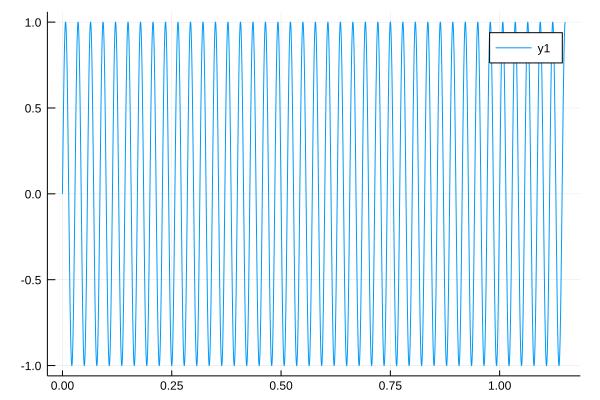

In [3]:
t = collect(0:(1 / params["sampling frequency"]):(kick["note length"] + kick["release"]))
a = [sin(e * kick["base frequency"] * 2 * pi) for e in t]
plot(t, a)

## Adding an envelope
first we need to make one!

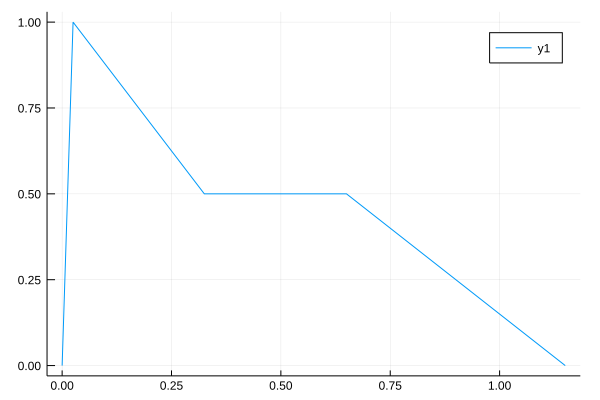

In [4]:
function envelope(t, l; attack=0.0, decay=0.0, sustain=1.0, release=0.0)
    if t < attack
        return t / attack
    elseif t < (attack + decay)
        progress_through_decay = (t - attack) / decay
        distance_to_go = 1 - sustain
        return 1 - distance_to_go * progress_through_decay
    elseif t < l
        return sustain
    elseif t < (l + release)
        progress_through_release = (t - l) / release
        return sustain * (1 - progress_through_release)
    else
        return 0.0
    end
end

kick_amp_env = [envelope(time, kick["note length"], attack=kick["attack"], decay=kick["decay"],
        sustain=kick["sustain"], release=kick["release"]) for time in t]
plot(t, kick_amp_env)

okay, that looks good. now let's

## Apply it to the sine wave

all we have to do is multiply them together elementwise.

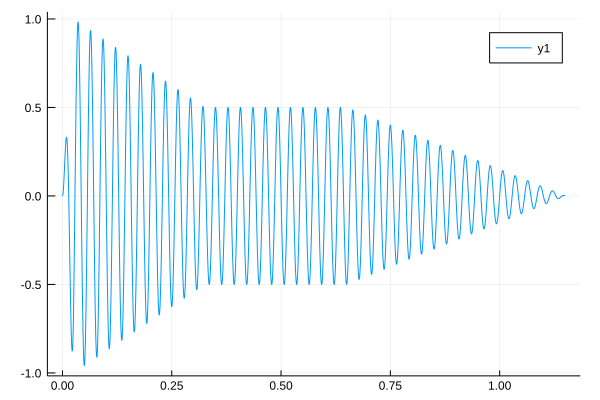

In [5]:
a2 = a .* kick_amp_env

plot(t, a2)